In [1]:
import os
import math
import torch
import numpy as np
import torchvision
import torch.nn as nn
from torch import optim
import torch.nn.functional as F
import matplotlib.pyplot as plt
from collections import defaultdict
from pytorch_grad_cam import EigenCAM
from torch.utils.data import DataLoader
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from pytorch_metric_learning import losses
from pytorch_grad_cam.utils.image import show_cam_on_image

## Config

In [2]:
BASE_DIR = os.path.dirname(os.getcwd())
DATA_PATH = os.path.join(BASE_DIR, "data", "dataset")

CONFIG = {
    "TRAINSET_DIR": os.path.join(DATA_PATH, "Raw"), # Train ?
    "TESTSET_DIR": os.path.join(DATA_PATH, "Test"),
    "VALSET_DIR": os.path.join(DATA_PATH, "Valid"),
    "UNSEEN_DIR": os.path.join(DATA_PATH, "Unseen"),
    "BATCH_SIZE": 18,
    "EPOCH": 15,
    "IMAGE_SIZE": (224, 224),
    "EMBEDDING_SIZE": 128,
}

for key in ["TRAINSET_DIR", "TESTSET_DIR", "VALSET_DIR", "UNSEEN_DIR"]:
    if not os.path.exists(CONFIG[key]):
        print(f"❌ Missing directory: {CONFIG[key]}")

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## Helper Function

In [4]:
def imshow(img, text=None):
    npimg = img.numpy()
    plt.axis("off")
    if text:
        plt.text(75, 8, text, style='italic',fontweight='bold',
            bbox={'facecolor':'white', 'alpha':0.8, 'pad':10})

    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

def show_plot(iteration,loss):
    plt.plot(iteration,loss)
    plt.show()

In [5]:
def recall_at_k(embeddings, labels, k=5):
    embeddings = embeddings.to(device)
    labels = labels.to(device)

    cosine_sim = torch.mm(embeddings, embeddings.t())
    _, indices = torch.topk(cosine_sim, k=k+1, dim=1)  # k+1 because first is self
    indices = indices[:, 1:]  # Remove self index

    correct_at_k = 0
    total = len(labels)

    for i in range(total):
        true_label = labels[i].item()
        retrieved_labels = labels[indices[i]].tolist()
        if true_label in retrieved_labels:
            correct_at_k += 1

    recall = correct_at_k / total
    print(f"Recall@{k}: {recall * 100:.2f}%")
    return recall

In [6]:
def denormalize(tensor):
    if tensor.size(0) == 1:  # grayscale
        mean = torch.tensor([0.5]).view(1, 1, 1)
        std = torch.tensor([0.5]).view(1, 1, 1)
    else:  # RGB
        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

    return tensor * std + mean

In [7]:
def calculate_nn_accuracy(embeddings, labels):
    sim_matrix = torch.matmul(embeddings, embeddings.t())
    batch_size = embeddings.size(0)
    correct = 0
    for i in range(batch_size):
        sim_row = sim_matrix[i].clone()
        sim_row[i] = -1  # Exclude self
        _, idx = torch.max(sim_row, dim=0)
        if labels[i] == labels[idx]:
            correct += 1
    return correct / (batch_size - 1) if batch_size > 1 else 0

## Load Dataset

In [8]:
transform = transforms.Compose([
    transforms.Resize(CONFIG['IMAGE_SIZE']),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [9]:
train_dataset = datasets.ImageFolder(root=CONFIG['TRAINSET_DIR'], transform=transform)
val_dataset = datasets.ImageFolder(root=CONFIG['VALSET_DIR'], transform=transform)
test_dataset = datasets.ImageFolder(root=CONFIG['TESTSET_DIR'], transform=transform)
unseen_dataset = datasets.ImageFolder(root=CONFIG['UNSEEN_DIR'], transform=transform)

In [10]:
dataset_size = len(train_dataset)
BATCH_SIZE = math.ceil(dataset_size / CONFIG["BATCH_SIZE"])

In [11]:
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=True)
unseen_loader = DataLoader(unseen_dataset, batch_size=BATCH_SIZE, shuffle=True)

## Setup

In [12]:
class DeepSearchShoeModel(nn.Module):
      def __init__(self, embedding_size=128):
          super(DeepSearchShoeModel, self).__init__()

          self.backbone = torchvision.models.resnet18(pretrained=True)

          in_dim = self.backbone.fc.in_features
          self.backbone.fc = nn.Identity()
          self.fc = nn.Linear(in_dim, embedding_size)
          self.dropout = nn.Dropout(0.3)

      def forward(self, x):
          feat = self.backbone(x)
          emb = self.fc(feat)
          emb = self.dropout(emb)
          emb = F.normalize(emb, p=2, dim=1)
          return emb

## Training

In [13]:
model = DeepSearchShoeModel(embedding_size=CONFIG['EMBEDDING_SIZE']).to(device)
loss_fn = losses.MultiSimilarityLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)

/opt/anaconda3/envs/deep_search/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/anaconda3/envs/deep_search/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [14]:
train_losses = []
train_accuracies = []
val_losses = []
val_accuracies = []

for epoch in range(CONFIG['EPOCH']):
    running_loss = 0.0
    correct = 0
    total = 0
    model.train()
    
    for imgs, labels in train_loader:
        imgs = imgs.to(device)
        labels = labels.to(device)

        embeddings = model(imgs)
        loss = loss_fn(embeddings, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        # คำนวณ train accuracy แบบเดียวกับ val
        sim_matrix = torch.matmul(embeddings, embeddings.t())
        batch_size = embeddings.size(0)
        for i in range(batch_size):
            sim_row = sim_matrix[i]
            sim_row[i] = -1  # exclude self
            _, idx = torch.max(sim_row, dim=0)
            if labels[i] == labels[idx]:
                correct += 1
            total += 1

    scheduler.step()

    avg_train_loss = running_loss / len(train_loader)
    train_losses.append(avg_train_loss)
    train_accuracy = correct / total if total > 0 else 0
    train_accuracies.append(train_accuracy)

    # Validation phase
    model.eval()
    val_running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for imgs, labels in val_loader:
            imgs = imgs.to(device)
            labels = labels.to(device)

            embeddings = model(imgs)
            loss = loss_fn(embeddings, labels)
            val_running_loss += loss.item()

            sim_matrix = torch.matmul(embeddings, embeddings.t())

            batch_size = embeddings.size(0)
            for i in range(batch_size):
                sim_row = sim_matrix[i]
                sim_row[i] = -1  # exclude self
                _, idx = torch.max(sim_row, dim=0)
                if labels[i] == labels[idx]:
                    correct += 1
                total += 1

    avg_val_loss = val_running_loss / len(val_loader)
    val_losses.append(avg_val_loss)
    val_accuracy = correct / total if total > 0 else 0
    val_accuracies.append(val_accuracy)

    print(f"Epoch {epoch+1}, Train Loss: {avg_train_loss:.4f}, Train Acc: {train_accuracy:.4f}, Val Loss: {avg_val_loss:.4f}, Val Acc: {val_accuracy:.4f}")


Epoch 1, Train Loss: 0.2395, Train Acc: 0.2363, Val Loss: 0.5593, Val Acc: 0.1667
Epoch 2, Train Loss: 0.2661, Train Acc: 0.2363, Val Loss: 0.5483, Val Acc: 0.2167
Epoch 3, Train Loss: 0.2810, Train Acc: 0.2363, Val Loss: 0.5359, Val Acc: 0.1000
Epoch 4, Train Loss: 0.3172, Train Acc: 0.2473, Val Loss: 0.4658, Val Acc: 0.2667
Epoch 5, Train Loss: 0.2835, Train Acc: 0.2802, Val Loss: 0.5131, Val Acc: 0.2000
Epoch 6, Train Loss: 0.3100, Train Acc: 0.2857, Val Loss: 0.4661, Val Acc: 0.2167
Epoch 7, Train Loss: 0.3027, Train Acc: 0.2308, Val Loss: 0.5412, Val Acc: 0.1167
Epoch 8, Train Loss: 0.2420, Train Acc: 0.1648, Val Loss: 0.5395, Val Acc: 0.1833
Epoch 9, Train Loss: 0.2690, Train Acc: 0.2253, Val Loss: 0.4030, Val Acc: 0.1833
Epoch 10, Train Loss: 0.2296, Train Acc: 0.2308, Val Loss: 0.4916, Val Acc: 0.2000
Epoch 11, Train Loss: 0.2706, Train Acc: 0.2582, Val Loss: 0.4997, Val Acc: 0.2833
Epoch 12, Train Loss: 0.2666, Train Acc: 0.2582, Val Loss: 0.3803, Val Acc: 0.1167
Epoch 13, Tra

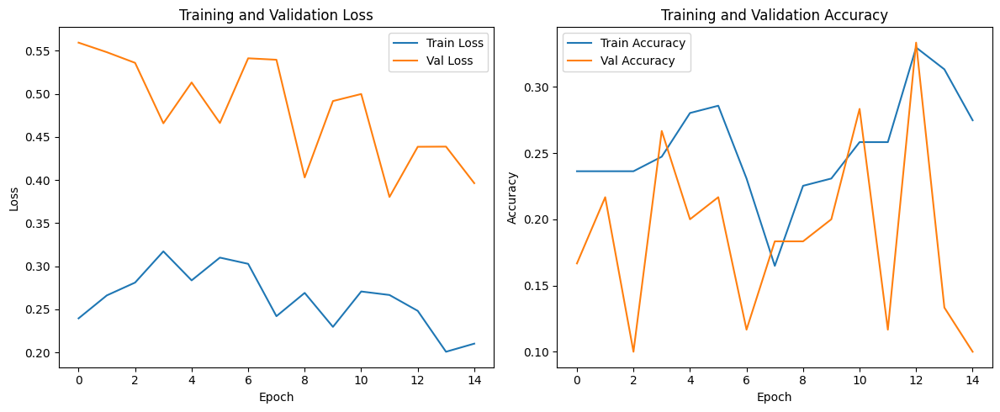

In [15]:
plt.figure(figsize=(12,5))

# กราฟ Loss
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# กราฟ Accuracy
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Train Accuracy')
plt.plot(val_accuracies, label='Val Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

## Evaluate

In [16]:
model.eval()

DeepSearchShoeModel(
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=Tr

In [17]:
with torch.no_grad():
    embeddings = []
    labels = []
    for images, targets in test_loader:
        images = images.to(device)
        targets = targets.to(device)
        output = model(images)
        embeddings.append(output)
        labels.append(targets)
    embeddings = torch.cat(embeddings)
    labels = torch.cat(labels)

In [18]:
embeddings = embeddings.to(device)
labels = labels.to(device)

cosine_sim = torch.mm(embeddings, embeddings.t())  # [N, N]

_, indices = torch.topk(cosine_sim, k=2, dim=1)
nearest_neighbor_indices = indices[:, 1]

nearest_labels = labels[nearest_neighbor_indices]
accuracy = (nearest_labels == labels).float().mean().item()

print(f"Nearest Neighbor Accuracy: {accuracy*100:.2f}%")

Nearest Neighbor Accuracy: 48.33%


In [19]:
embeddings = embeddings.to(device)
labels = labels.to(device)

cosine_sim = torch.mm(embeddings, embeddings.t())

_, indices = torch.topk(cosine_sim, k=2, dim=1)
nearest_neighbor_indices = indices[:, 1]

nearest_labels = labels[nearest_neighbor_indices]

class_correct = defaultdict(int)
class_total = defaultdict(int)

for i in range(len(labels)):
    true_label = labels[i].item()
    pred_label = nearest_labels[i].item()

    class_total[true_label] += 1
    if true_label == pred_label:
        class_correct[true_label] += 1

class_accuracy = {}
for c in class_total:
    class_accuracy[c] = class_correct[c] / class_total[c]

for c, acc in class_accuracy.items():
    print(f"Class {c}: Accuracy = {acc*100:.2f}%")


Class 11: Accuracy = 25.00%
Class 13: Accuracy = 50.00%
Class 0: Accuracy = 50.00%
Class 1: Accuracy = 75.00%
Class 6: Accuracy = 0.00%
Class 9: Accuracy = 100.00%
Class 14: Accuracy = 50.00%
Class 3: Accuracy = 75.00%
Class 10: Accuracy = 100.00%
Class 8: Accuracy = 25.00%
Class 4: Accuracy = 50.00%
Class 7: Accuracy = 0.00%
Class 2: Accuracy = 25.00%
Class 5: Accuracy = 75.00%
Class 12: Accuracy = 25.00%


In [20]:
def recall_at_k(embeddings, labels, k=5):
    embeddings = embeddings.to(device)
    labels = labels.to(device)

    cosine_sim = torch.mm(embeddings, embeddings.t())
    _, indices = torch.topk(cosine_sim, k=k+1, dim=1)  # k+1 because first is self
    indices = indices[:, 1:]  # Remove self index

    correct_at_k = 0
    total = len(labels)

    for i in range(total):
        true_label = labels[i].item()
        retrieved_labels = labels[indices[i]].tolist()
        if true_label in retrieved_labels:
            correct_at_k += 1

    recall = correct_at_k / total
    print(f"Recall@{k}: {recall * 100:.2f}%")
    return recall

In [21]:
recall = recall_at_k(embeddings, labels, k=5)

Recall@5: 75.00%


## Explainable AI

In [22]:
target_layers = [model.backbone.layer4[-1]]
cam = EigenCAM(model=model, target_layers=target_layers)

In [23]:
def denormalize(tensor):
    if tensor.size(0) == 1:  # grayscale
        mean = torch.tensor([0.5]).view(1, 1, 1)
        std = torch.tensor([0.5]).view(1, 1, 1)
    else:  # RGB
        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

    return tensor * std + mean

In [24]:
def visualize_worst_embeddings_cam(
    model, 
    data_loader, 
    cam, 
    denormalize_func, 
    class_names,
    device=None, 
    num_images=20, 
    rows=5, 
    cols=4
):
    if device is None:
        device = next(model.parameters()).device

    model.eval()
    embeddings = []
    labels_list = []
    images_list = []

    with torch.no_grad():
        for images, labels in data_loader:
            images = images.to(device)
            emb = model(images)
            embeddings.append(emb.cpu())
            labels_list.append(labels.cpu())
            images_list.append(images.cpu())

    embeddings = torch.cat(embeddings)
    labels_list = torch.cat(labels_list)
    images_list = torch.cat(images_list)

    class_centroids = {}
    for label in torch.unique(labels_list):
        class_embeddings = embeddings[labels_list == label]
        class_centroids[label.item()] = class_embeddings.mean(dim=0)

    distances = []
    for i in range(len(embeddings)):
        label = labels_list[i].item()
        emb = embeddings[i]
        centroid = class_centroids[label]
        dist = torch.norm(emb - centroid, p=2).item()
        distances.append((dist, i))

    distances.sort(key=lambda x: x[0], reverse=True)

    num_images = min(num_images, len(distances))
    fig, axs = plt.subplots(rows, cols, figsize=(cols*4, rows*4))
    axs = axs.flatten()

    for count in range(num_images):
        dist_value, idx = distances[count]
        img_tensor = images_list[idx]
        label = labels_list[idx].item()

        input_tensor = img_tensor.unsqueeze(0).to(device)
        input_tensor.requires_grad = True

        img_denorm = denormalize_func(img_tensor)
        img_numpy = np.transpose(img_denorm.numpy(), (1, 2, 0))
        img_numpy = np.clip(img_numpy, 0, 1)

        grayscale_cam = cam(input_tensor=input_tensor, targets=None)[0]
        cam_image = show_cam_on_image(img_numpy, grayscale_cam, use_rgb=True)

        axs[count].imshow(cam_image)
        axs[count].axis('off')
        if class_names is not None:
            axs[count].set_title(f"Dist: {dist_value:.4f}\nLabel: {class_names[label]}", fontsize=10)

    for j in range(num_images, rows*cols):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

### Train set

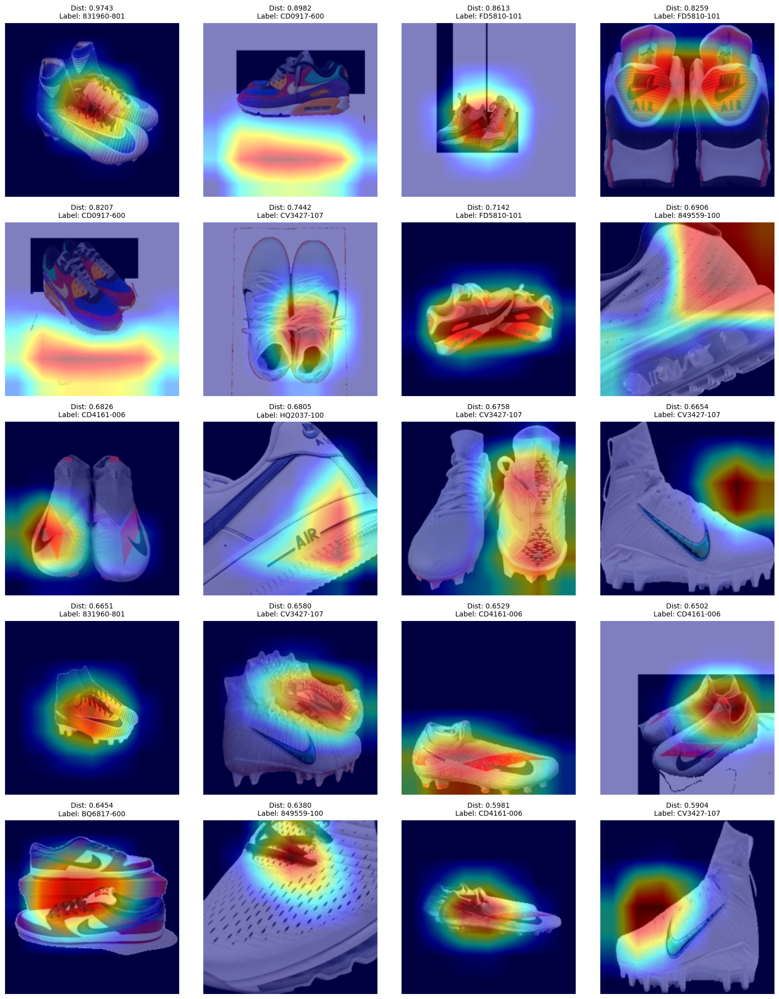

In [25]:
class_names = train_dataset.classes
# class_names = None
visualize_worst_embeddings_cam(model, train_loader, cam, denormalize, class_names, device)

### Test Set

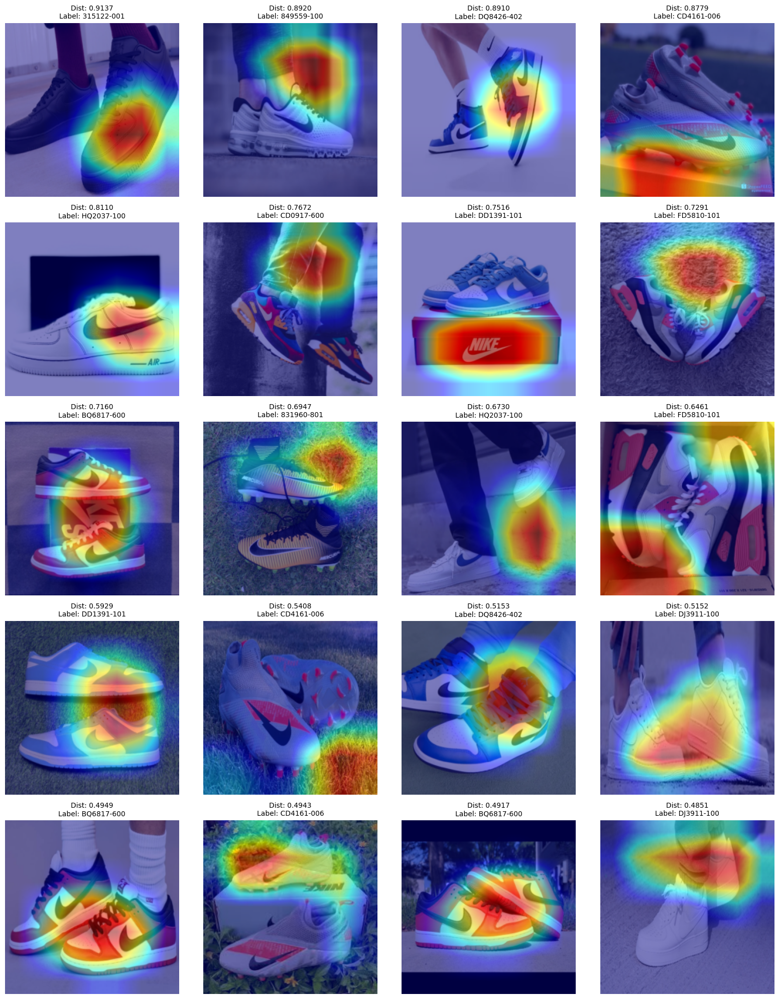

In [26]:
class_names = test_dataset.classes
# class_names = None
visualize_worst_embeddings_cam(model, test_loader, cam, denormalize, class_names, device)

## Unseen Dat

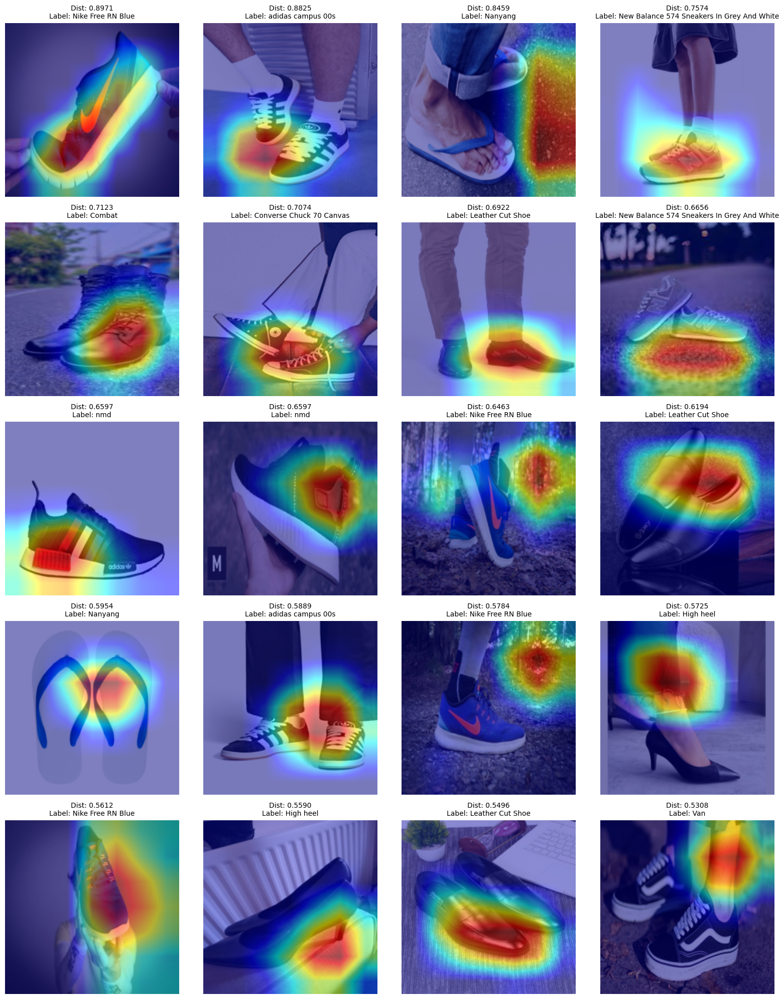

In [27]:
class_names = unseen_dataset.classes
# class_names = None
visualize_worst_embeddings_cam(model, unseen_loader, cam, denormalize, class_names, device)

In [28]:
def visualize_worst_embeddings_cam_single(
    model, 
    data_loader, 
    cam, 
    denormalize_func, 
    class_names,
    device=None, 
    num_images=20, 
    target_class=None  # target_class เป็นชื่อหรือเลข index ก็ได้
):
    if device is None:
        device = next(model.parameters()).device

    # แปลงชื่อคลาสเป็น index ถ้าเป็น string
    if target_class is not None:
        if isinstance(target_class, str):
            # หา index ของชื่อ class ใน class_names
            try:
                target_class_idx = class_names.index(target_class)
            except ValueError:
                raise ValueError(f"Class name '{target_class}' not found in class_names list.")
        else:
            target_class_idx = target_class
    else:
        target_class_idx = None

    model.eval()
    embeddings = []
    labels_list = []
    images_list = []

    with torch.no_grad():
        for images, labels in data_loader:
            images = images.to(device)
            emb = model(images)
            embeddings.append(emb.cpu())
            labels_list.append(labels.cpu())
            images_list.append(images.cpu())

    embeddings = torch.cat(embeddings)
    labels_list = torch.cat(labels_list)
    images_list = torch.cat(images_list)

    class_centroids = {}
    for label in torch.unique(labels_list):
        class_embeddings = embeddings[labels_list == label]
        class_centroids[label.item()] = class_embeddings.mean(dim=0)

    distances = []
    for i in range(len(embeddings)):
        label = labels_list[i].item()
        if target_class_idx is not None and label != target_class_idx:
            continue
        emb = embeddings[i]
        centroid = class_centroids[label]
        dist = torch.norm(emb - centroid, p=2).item()
        distances.append((dist, i))

    distances.sort(key=lambda x: x[0], reverse=True)
    num_images = min(num_images, len(distances))

    for count in range(num_images):
        dist_value, idx = distances[count]
        img_tensor = images_list[idx]
        label = labels_list[idx].item()

        input_tensor = img_tensor.unsqueeze(0).to(device)
        input_tensor.requires_grad = True

        img_denorm = denormalize_func(img_tensor)
        img_numpy = np.transpose(img_denorm.numpy(), (1, 2, 0))
        img_numpy = np.clip(img_numpy, 0, 1)

        grayscale_cam = cam(input_tensor=input_tensor, targets=None)[0]
        cam_image = show_cam_on_image(img_numpy, grayscale_cam, use_rgb=True)

        plt.figure(figsize=(6,6))
        plt.imshow(cam_image)
        plt.axis('off')
        plt.show()


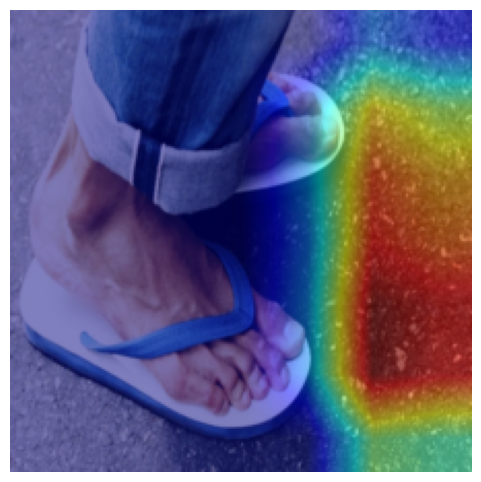

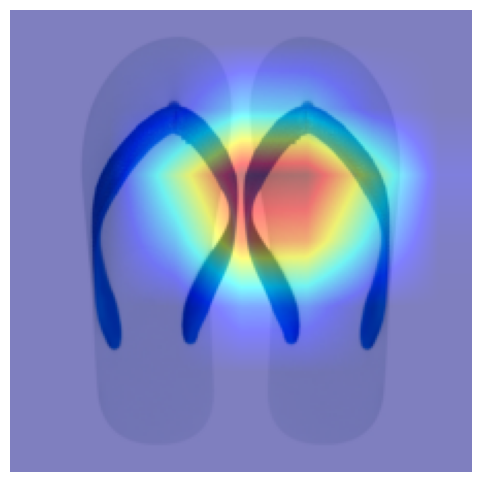

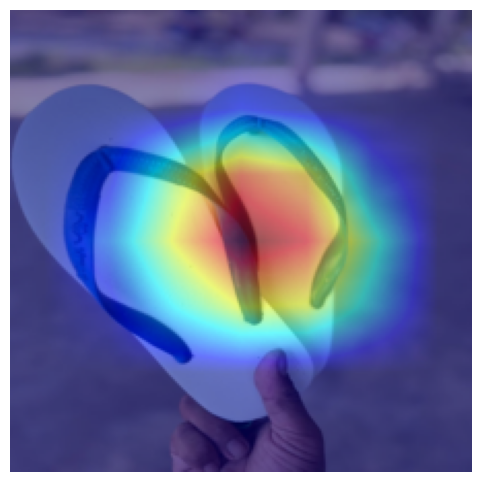

In [29]:
class_names = unseen_dataset.classes
visualize_worst_embeddings_cam_single(
    model,
    unseen_loader,
    cam,
    denormalize,
    class_names,
    device=device,
    num_images=5,
    target_class='Nanyang'  
)

## Export

In [163]:
torch.save(model.state_dict(), 'deep_search_shoe_model.pth')